In [3]:
import networkx as nx
import osmnx as ox
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(color_codes=True)
import numpy as np
import pandas as pd
import folium
import contextily as ctx
import geopandas as gpd
import mplleaflet
import overpy
from pyrosm import OSM, get_data
import pandana
import networkx as nx
from pandana.loaders import osm
import warnings
warnings.filterwarnings('ignore')
import osmnet
from shapely import wkt

In [2]:
ctx.__version__

'1.0.0'

In [3]:
overpass_client = overpy.Overpass()

# Road network of Tartu (walking network)

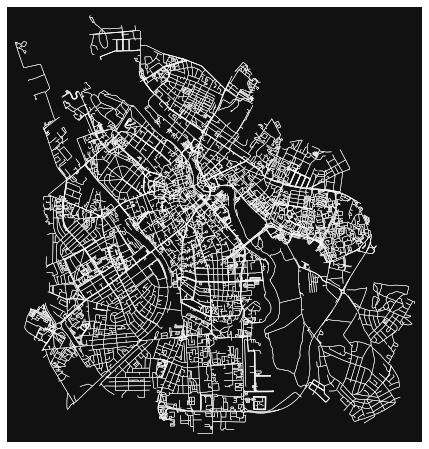

In [4]:
#walking network of Tartu
G = ox.graph_from_place("Tartu, Estonia",network_type="walk")
fig, ax = ox.plot_graph(G,node_size = 0,edge_linewidth = 0.5, edge_color = "white")

In [5]:
nodes, streets = ox.graph_to_gdfs(G)
streets.head()

osmid  oneway lanes  ref  \
u       v          key                                                        
8220933 6854135436 0                           117178126   False     5    3   
        8220941    0    [731962213, 730852870, 29394711]   False     4    3   
        6854135407 0                           731962221   False     3    3   
8220941 332221897  0                            28906993   False     2    3   
        332221894  0                            29394713   False     2  NaN   

                                     name        highway maxspeed   length  \
u       v          key                                                       
8220933 6854135436 0                 Riia          trunk       50   65.343   
        8220941    0    [Riia, Narva mnt]          trunk       50  137.133   
        6854135407 0                 Riia          trunk       50   39.572   
8220941 332221897  0            Narva mnt          trunk       40   55.405   
        332221894  0                  NaN  tertiary_link      NaN   56.966   

                                                                 geometry  \
u       v          key                                                      
8220933 6854135436 0    LINESTRING (26.73016 58.37857, 26.72998 58.378...   
        8220941    0    LINESTRING (26.73016 58.37857, 26.73027 58.378...   
        6854135407 0    LINESTRING (26.73016 58.37857, 26.73003 58.378...   
8220941 332221897  0    LINESTRING (26.73056 58.37979, 26.73061 58.379...   
        332221894  0    LINESTRING (26.73056 58.37979, 26.73068 58.380...   

                       bridge junction service access tunnel width  
u       v          key                                              
8220933 6854135436 0      NaN      NaN     NaN    NaN    NaN   NaN  
        8220941    0      yes      NaN     NaN    NaN    NaN   NaN  
        6854135407 0      NaN      NaN     NaN    NaN    NaN   NaN  
8220941 332221897  0      NaN      NaN     NaN    NaN    NaN   NaN  
        332221894  0      NaN      NaN     NaN    NaN    NaN   NaN

In [6]:
#EPSG:3301 - Estonian Coordinate System of 1997
nodes_3301=nodes.to_crs("EPSG:3301")
streets_3301=streets.to_crs("EPSG:3301")

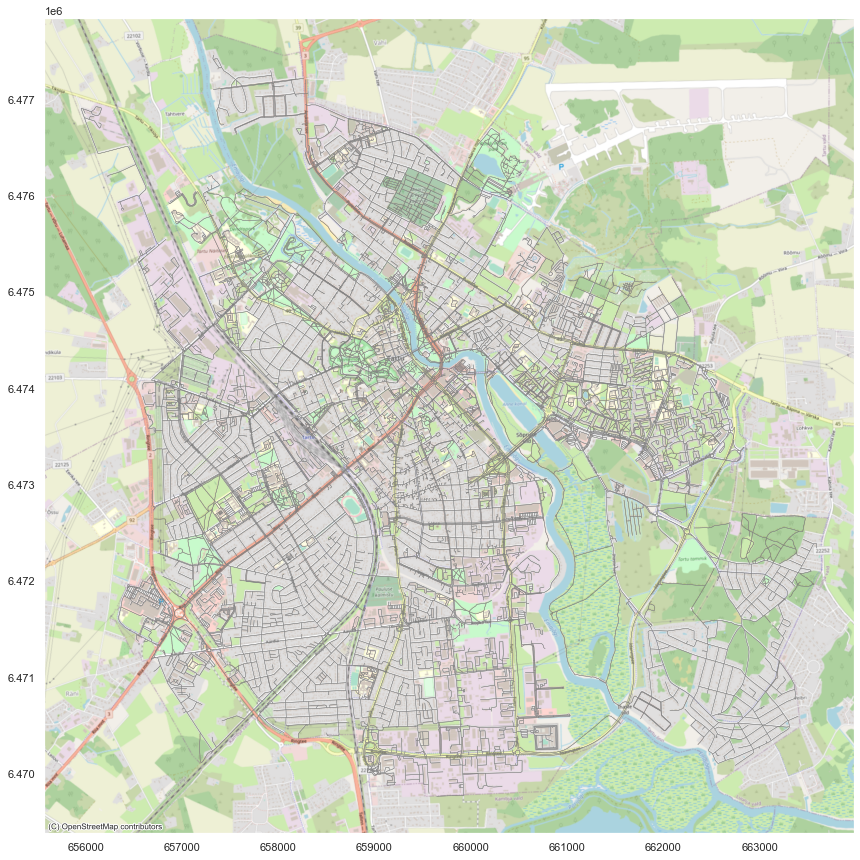

In [7]:
#walking network with basemap
fig,ax = plt.subplots(1,1, figsize=(15,15))
streets_3301.plot(ax=ax,linewidth=0.4,color="gray")
plt.grid(False)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")

#  Points of interest in Tartu

In [8]:
tags = {'amenity': True}
POI = ox.geometries_from_place('Tartu, Estonia', tags)

In [9]:
POI

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                              
node         322920315      Tartu           EE               31         50417   
             322943595      Tartu           EE               20         51009   
             323377901        NaN          NaN              NaN           NaN   
             331179291        NaN          NaN              NaN           NaN   
             332950268      Tartu           EE                8         51004   
...                           ...          ...              ...           ...   
way          1021163496       NaN          NaN              NaN           NaN   
             1038982213       NaN          NaN              NaN           NaN   
relation     6740798          NaN          NaN              NaN           NaN   
             11633951         NaN          NaN              NaN           NaN   
             12767188         NaN          NaN              NaN           NaN   

                        addr:street     amenity                 email  \
element_type osmid                                                      
node         322920315         Raja    pharmacy        haru@apteek.ee   
             322943595      Raatuse    pharmacy  raatuse@uusapteek.ee   
             323377901          NaN    post_box                   NaN   
             331179291          NaN         pub                   NaN   
             332950268          Poe    pharmacy    kesklinnaapt@ut.ee   
...                             ...         ...                   ...   
way          1021163496         NaN     parking                   NaN   
             1038982213         NaN      school                   NaN   
relation     6740798            NaN     parking                   NaN   
             11633951           NaN  university                   NaN   
             12767188           NaN     parking                   NaN   

                        healthcare                             name  \
element_type osmid                                                    
node         322920315    pharmacy                      Raja Apteek   
             322943595         NaN                   Raatuse Apteek   
             323377901         NaN                              NaN   
             331179291         NaN                           Zavood   
             332950268    pharmacy  Tartu Ülikooli Kesklinna Apteek   
...                            ...                              ...   
way          1021163496        NaN                              NaN   
             1038982213        NaN                              NaN   
relation     6740798           NaN                              NaN   
             11633951          NaN                  Õigusteaduskond   
             12767188          NaN                              NaN   

                                             opening_hours  ...  \
element_type osmid                                          ...   
node         322920315   Mo-Th 08:00-17:30; Fr 08:00-16:00  ...   
             322943595   Mo-Fr 09:00-20:00; Sa 10:00-18:00  ...   
             323377901                                 NaN  ...   
             331179291                                 NaN  ...   
             332950268   Mo-Fr 08:00-20:00; Sa 09:00-17:00  ...   
...                                                    ...  ...   
way          1021163496                                NaN  ...   
             1038982213                                NaN  ...   
relation     6740798                                   NaN  ...   
             11633951                                  NaN  ...   
             12767188                                  NaN  ...   

                        payment:prepaid_cards payment:token  \
element_type osmid                                            
node         322920315                    NaN           NaN   
             322943595             

In [10]:
POI.reset_index()["element_type"].unique()

array(['node', 'way', 'relation'], dtype=object)

In [11]:
POI_3301=POI.to_crs("EPSG:3301")

In [12]:
#calculate centroids for simlicity
POI_3301["geometry"] = POI_3301.centroid
POI["geometry"] = POI.centroid

C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\1575554792.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  POI["geometry"] = POI.centroid


C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\2086473233.py:4: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\contextily\tile.py:352: RasterioDeprecationWarning: Source dataset should be opened in read-only mode. Use of datasets opened in modes other than 'r' will be disallowed in a future version.
  w_img, vrt = _warper(


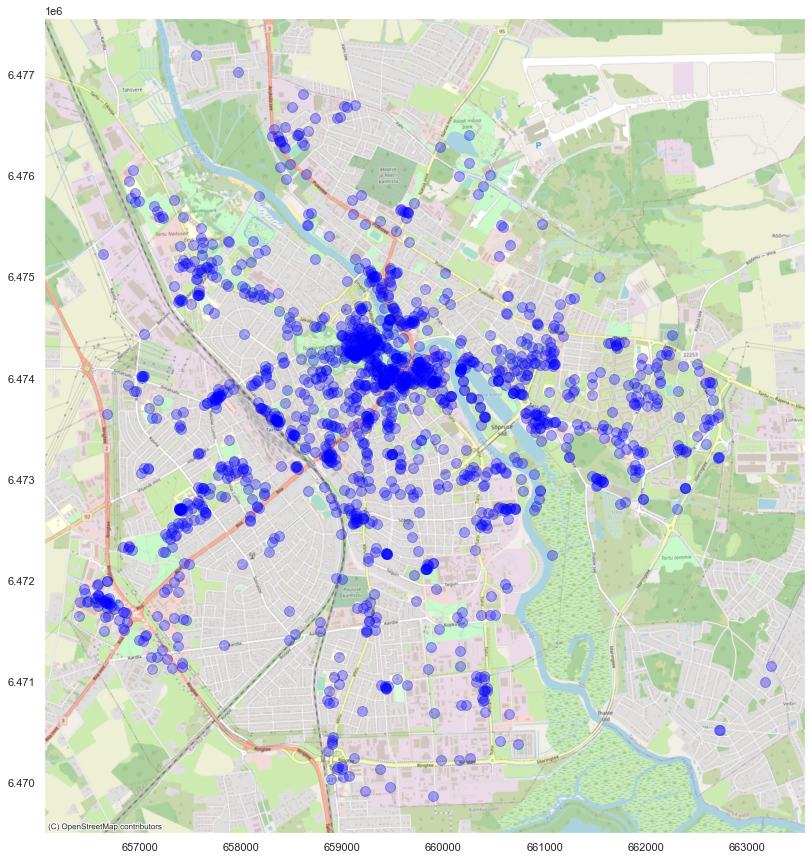

In [13]:
#map of all POI in Tartu
fig,ax = plt.subplots(1,1, figsize=(15,15))
POI_3301.plot(ax=ax,alpha=0.3,color="blue",markersize=100)
plt.grid(False)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")

# POIs and Road network

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\AppData\Local\Te

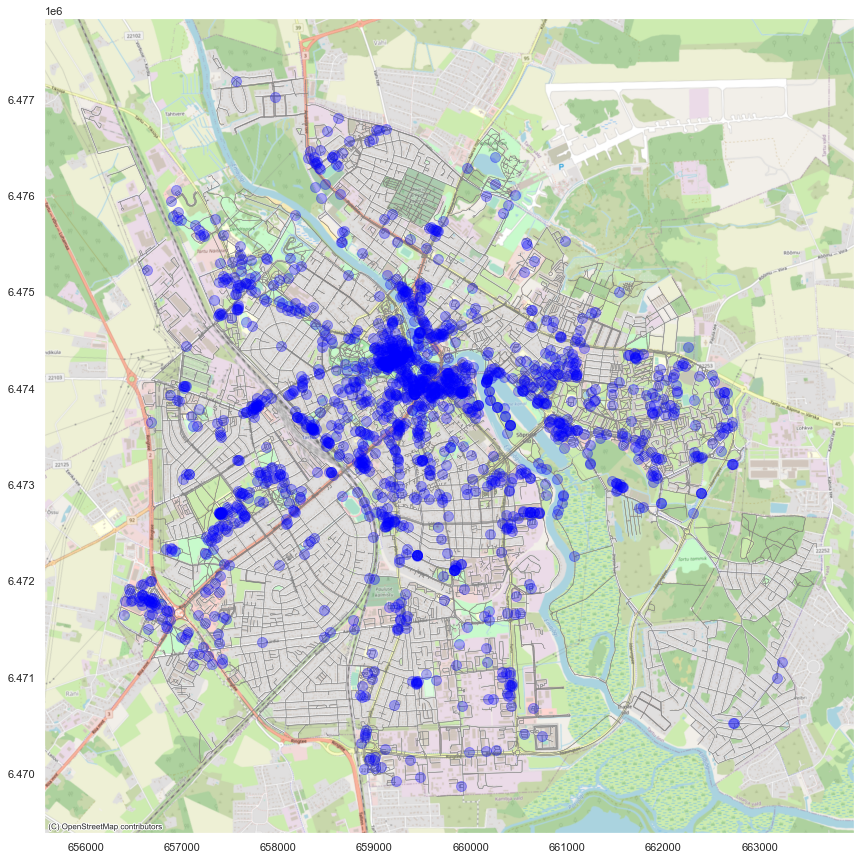

In [14]:
#POI and walking network with basemap
fig,ax = plt.subplots(1,1, figsize=(15,15))
POI_3301.plot(ax=ax,alpha=0.3,color="blue",zorder=2,markersize=100)
streets_3301.plot(ax=ax,linewidth=0.4,color="gray",zorder=1)
plt.grid(False)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")

# Distances between the POIs and road network intersection nodes

In [15]:
#network from box covering Tartu
network = osm.pdna_network_from_bbox(58.330865,26.62424,58.427945,26.836414)

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnet\load.py:445: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf.crs = crs
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\pyproj\crs\crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnet\load.py:445: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf.crs = crs
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnet\load.py:147: ShapelyDeprecationWarning: __len__ for multi-part geo

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](58.33086500,26.62424000,58.42794500,26.83641400);>;);out;'}"


C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnet\load.py:237: DeprecationWarning: Flags not at the start of the expression '//(?s)(.*?)/'
  domain = re.findall(r'//(?s)(.*?)/', url)[0]
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnet\load.py:171: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  ' {:,.2f} seconds'.format(len(geometry), time.time()-start_time))


Downloaded 7,363.9KB from www.overpass-api.de in 2.54 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.70 seconds
Returning OSM data with 52,469 nodes and 11,167 ways...
Edge node pairs completed. Took 15.24 seconds
Returning processed graph with 16,181 nodes and 23,784 edges...
Completed OSM data download and Pandana node and edge table creation in 18.91 seconds


In [16]:
network.edges_df

from          to   distance
8220933    8220937        8220933     8220937  55.883880
           6854135436     8220933  6854135436  65.315136
8220937    6845284091     8220937  6845284091  58.194957
8220941    332221894      8220941   332221894  55.681436
           332221897      8220941   332221897  55.117052
...                           ...         ...        ...
9634231486 9634231484  9634231486  9634231484  35.334529
9694890969 330042607   9694890969   330042607  27.211448
           9694890974  9694890969  9694890974  20.902787
9694890973 8157535477  9694890973  8157535477  82.103047
9694890974 9694890973  9694890974  9694890973   9.079948

[24104 rows x 3 columns]

In [17]:
network.nodes_df

,x,y
id,,
8220933,26.730165,58.378573
8220937,26.730356,58.379065
8220941,26.730560,58.379786
8220974,26.726640,58.386388
8221115,26.728486,58.389628
...,...,...
9634231484,26.725708,58.413244
9634231486,26.726314,58.413233
9694890969,26.741194,58.366988


In [18]:
network = pandana.Network(network.nodes_df['x'], network.nodes_df['y'], 
                          network.edges_df['from'], network.edges_df['to'], network.edges_df[['distance']])

In [19]:
network.set_pois(category = 'POI',
                 maxdist = 100000,
                 maxitems = len(network.nodes_df),
                 x_col = POI["geometry"].reset_index()["geometry"].x, 
                 y_col = POI["geometry"].reset_index()["geometry"].y)

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\pandana\network.py:660: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxitems, type(pd.Series())):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\pandana\network.py:668: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxdist, type(pd.Series())):


In [20]:
#calculate distance from each intersection to 5 nearest POI
results = network.nearest_pois(distance = 100000,
                               category = 'POI',
                               num_pois = 5,
                               include_poi_ids = True)
results

,1,2,3,4,5,poi1,poi2,poi3,poi4,poi5
id,,,,,,,,,,
8220933,119.190002,131.156006,131.580002,143.690002,143.690002,362.0,366.0,147.0,423.0,906.0
8220937,175.072998,187.039001,187.462997,199.572998,199.572998,362.0,366.0,147.0,423.0,906.0
8220941,162.701004,170.119003,192.936005,227.399002,256.127991,1007.0,1006.0,1005.0,215.0,362.0
8220974,50.122002,83.512001,83.512001,89.620003,89.620003,1510.0,841.0,1512.0,838.0,940.0
8221115,76.574997,136.216995,222.897003,235.731003,292.247009,944.0,1432.0,448.0,919.0,207.0
...,...,...,...,...,...,...,...,...,...,...
9634231484,1877.687012,1905.285034,1978.928955,2092.269043,2131.999023,450.0,1383.0,678.0,892.0,1382.0
9634231486,1913.020996,1940.619019,2014.262939,2127.603027,2167.333008,450.0,1383.0,678.0,892.0,1382.0
9694890969,62.842999,62.842999,186.679993,186.679993,199.582001,380.0,1216.0,125.0,1163.0,128.0


In [21]:
tartu_borders=gpd.read_file("tartu_borders.shp")
tartu_borders.crs

<Derived Projected CRS: EPSG:3301>
Name: Estonian Coordinate System of 1997
Axis Info [cartesian]:
- X[north]: Northing (metre)
- Y[east]: Easting (metre)
Area of Use:
- name: Estonia - onshore and offshore.
- bounds: (20.37, 57.52, 28.2, 60.0)
Coordinate Operation:
- name: Estonian National Grid
- method: Lambert Conic Conformal (2SP)
Datum: Estonia 1997
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [22]:
nodes_gdf = gpd.GeoDataFrame(
    network.nodes_df, geometry=gpd.points_from_xy(network.nodes_df.x, network.nodes_df.y),crs="EPSG:4326")

In [23]:
nodes_3301=nodes_gdf.to_crs("EPSG:3301")
nodes_3301

,x,y,geometry
id,,,
8220933,26.730165,58.378573,POINT (659682.195 6474149.521)
8220937,26.730356,58.379065,POINT (659691.158 6474204.763)
8220941,26.730560,58.379786,POINT (659699.775 6474285.473)
8220974,26.726640,58.386388,POINT (659440.766 6475010.837)
8221115,26.728486,58.389628,POINT (659534.012 6475375.794)
...,...,...,...
9634231484,26.725708,58.413244,POINT (659264.803 6477997.286)
9634231486,26.726314,58.413233,POINT (659300.249 6477997.602)
9694890969,26.741194,58.366988,POINT (660379.654 6472886.570)


In [24]:
nodes_tartu=gpd.sjoin(nodes_3301,tartu_borders,op="within")
nodes_tartu

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\IPython\core\interactiveshell.py:3301: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,x,y,geometry,index_right,ANIMI,AKOOD,TYYP,ONIMI,OKOOD,MNIMI,MKOOD
id,,,,,,,,,,,
8220933,26.730165,58.378573,POINT (659682.195 6474149.521),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8220937,26.730356,58.379065,POINT (659691.158 6474204.763),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8220941,26.730560,58.379786,POINT (659699.775 6474285.473),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8220974,26.726640,58.386388,POINT (659440.766 6475010.837),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8221115,26.728486,58.389628,POINT (659534.012 6475375.794),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
...,...,...,...,...,...,...,...,...,...,...,...
9567774783,26.693269,58.382742,POINT (657506.744 6474526.309),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
9567774794,26.692412,58.383384,POINT (657453.768 6474595.676),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
9694890969,26.741194,58.366988,POINT (660379.654 6472886.570),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079


In [25]:
#leave points that were within Tartu's borders
results_tartu=results.loc[nodes_tartu.index]
results_tartu

,1,2,3,4,5,poi1,poi2,poi3,poi4,poi5
id,,,,,,,,,,
8220933,119.190002,131.156006,131.580002,143.690002,143.690002,362.0,366.0,147.0,423.0,906.0
8220937,175.072998,187.039001,187.462997,199.572998,199.572998,362.0,366.0,147.0,423.0,906.0
8220941,162.701004,170.119003,192.936005,227.399002,256.127991,1007.0,1006.0,1005.0,215.0,362.0
8220974,50.122002,83.512001,83.512001,89.620003,89.620003,1510.0,841.0,1512.0,838.0,940.0
8221115,76.574997,136.216995,222.897003,235.731003,292.247009,944.0,1432.0,448.0,919.0,207.0
...,...,...,...,...,...,...,...,...,...,...
9567774783,288.798004,288.798004,297.256989,302.167999,310.121002,107.0,201.0,103.0,1159.0,1359.0
9567774794,206.897995,206.897995,209.996002,215.356995,245.848007,107.0,201.0,1159.0,103.0,922.0
9694890969,62.842999,62.842999,186.679993,186.679993,199.582001,380.0,1216.0,125.0,1163.0,128.0


# Accessibility map for walking distance to the restaurants

In [26]:
tags = {'amenity': 'restaurant'}
restaurants = ox.geometries_from_place('Tartu, Estonia', tags)
restaurants

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnx\geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))


addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                              
node         334456632      Tartu           EE               12         51004   
             334456780        NaN          NaN              NaN           NaN   
             334456848      Tartu          NaN               20         51004   
             334459163        NaN          NaN              NaN           NaN   
             334459676        NaN          NaN              NaN           NaN   
             334460175        NaN          NaN              NaN           NaN   
             334460433      Tartu          NaN                3         51007   
             334460663        NaN          NaN              NaN           NaN   
             334460818        NaN          NaN              NaN           NaN   
             334464814      Tartu          NaN                7           NaN   
             334466441        NaN          NaN              NaN           NaN   
             334466976        NaN          NaN              NaN           NaN   
             429770743        NaN          NaN                3         53007   
             448307168        NaN          NaN              NaN           NaN   
             912039626        NaN          NaN                4           NaN   
             937578127        NaN          NaN              NaN           NaN   
             1191341942     Tartu          NaN                4           NaN   
             1191342846     Tartu          NaN               15           NaN   
             1191348181     Tartu          NaN                6           NaN   
             1191349151       NaN          NaN              NaN           NaN   
             1191352962     Tartu          NaN               21           NaN   
             1268888699       NaN          NaN                2           NaN   
             1268901722       NaN          NaN              NaN           NaN   
             1433460361       NaN          NaN              NaN           NaN   
             2384089635     Tartu          NaN              15B         51010   
             2547042617       NaN          NaN              NaN           NaN   
             2558853654       NaN          NaN              NaN           NaN   
             2561096282       NaN          NaN              NaN           NaN   
             2833356290       NaN          NaN              NaN           NaN   
             3374630875       NaN          NaN              NaN           NaN   
             4414459493       NaN          NaN              NaN           NaN   
             4414504789       NaN          NaN              NaN         51007   
             4414513889       NaN          NaN              NaN           NaN   
             4775230478       NaN          NaN              NaN           NaN   
             4779106544       NaN          NaN              NaN           NaN   
             4947542690       NaN          NaN                9           NaN   
             5775364353       NaN          NaN              NaN           NaN   
             5875632594     Tartu          NaN                1         51004   
             5965698947       NaN          NaN              NaN           NaN   
             6304094839       NaN          NaN              NaN           NaN   
             6418282386       NaN          NaN              NaN           NaN   
             6577673185       NaN          NaN              NaN           NaN   
             7555583385       NaN          NaN              NaN           NaN   
             7796373831     Tartu           EE              55f           NaN   
             7798306998       NaN          NaN              NaN           NaN   
way          30227522       Tartu           EE             132A           NaN   
             278982502        NaN          NaN              NaN           NaN   
             423609793        NaN          NaN         

In [27]:
restaurants["geometry"] = restaurants.centroid

C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\2482192568.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  restaurants["geometry"] = restaurants.centroid


In [28]:
network.set_pois(category = 'restaurant',
                 maxdist = 100000,
                 maxitems = len(network.nodes_df),
                 x_col = restaurants["geometry"].reset_index()["geometry"].x, 
                 y_col = restaurants["geometry"].reset_index()["geometry"].y)

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\pandana\network.py:660: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxitems, type(pd.Series())):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\pandana\network.py:668: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxdist, type(pd.Series())):


In [29]:
restaurants_accessibility = network.nearest_pois(distance = 100000,
                               category = 'restaurant',
                               num_pois = 5,
                               include_poi_ids = True)
restaurants_accessibility

,1,2,3,4,5,poi1,poi2,poi3,poi4,poi5
id,,,,,,,,,,
8220933,143.690002,148.608994,250.028000,260.791992,274.545990,40.0,47.0,11.0,37.0,26.0
8220937,199.572998,204.492004,305.911011,316.674988,330.428986,40.0,47.0,11.0,37.0,26.0
8220941,280.627991,285.546997,316.713013,386.966003,397.730011,40.0,47.0,18.0,11.0,37.0
8220974,500.152008,655.463013,746.978027,750.039001,764.760010,41.0,7.0,25.0,2.0,3.0
8221115,656.786011,827.901978,1007.911987,1099.427002,1117.208984,36.0,41.0,7.0,25.0,3.0
...,...,...,...,...,...,...,...,...,...,...
9634231484,4224.079102,4332.294922,4526.201172,4617.715820,4619.477051,36.0,41.0,7.0,25.0,42.0
9634231486,4259.413086,4367.628906,4561.535156,4653.049805,4654.811035,36.0,41.0,7.0,25.0,42.0
9694890969,186.679993,430.997986,565.523010,1176.991943,1334.911987,22.0,46.0,15.0,39.0,19.0


In [30]:
#distance from intersections to 5 nearest restaurants in Tartu
restaurants_tartu=restaurants_accessibility.loc[nodes_tartu.index]
restaurants_tartu

,1,2,3,4,5,poi1,poi2,poi3,poi4,poi5
id,,,,,,,,,,
8220933,143.690002,148.608994,250.028000,260.791992,274.545990,40.0,47.0,11.0,37.0,26.0
8220937,199.572998,204.492004,305.911011,316.674988,330.428986,40.0,47.0,11.0,37.0,26.0
8220941,280.627991,285.546997,316.713013,386.966003,397.730011,40.0,47.0,18.0,11.0,37.0
8220974,500.152008,655.463013,746.978027,750.039001,764.760010,41.0,7.0,25.0,2.0,3.0
8221115,656.786011,827.901978,1007.911987,1099.427002,1117.208984,36.0,41.0,7.0,25.0,3.0
...,...,...,...,...,...,...,...,...,...,...
9567774783,1363.905029,1525.239014,1528.626953,1852.014038,1852.014038,33.0,13.0,42.0,17.0,31.0
9567774794,1448.427002,1609.760986,1613.149048,1936.536011,1936.536011,33.0,13.0,42.0,17.0,31.0
9694890969,186.679993,430.997986,565.523010,1176.991943,1334.911987,22.0,46.0,15.0,39.0,19.0


In [33]:
restaurants_tartu_coord=pd.concat([restaurants_tartu,nodes_tartu[["x","y"]]],axis=1)
restaurants_tartu_coord

,1,2,3,4,5,poi1,poi2,poi3,poi4,poi5,x,y
id,,,,,,,,,,,,
8220933,143.690002,148.608994,250.028000,260.791992,274.545990,40.0,47.0,11.0,37.0,26.0,26.730165,58.378573
8220937,199.572998,204.492004,305.911011,316.674988,330.428986,40.0,47.0,11.0,37.0,26.0,26.730356,58.379065
8220941,280.627991,285.546997,316.713013,386.966003,397.730011,40.0,47.0,18.0,11.0,37.0,26.730560,58.379786
8220974,500.152008,655.463013,746.978027,750.039001,764.760010,41.0,7.0,25.0,2.0,3.0,26.726640,58.386388
8221115,656.786011,827.901978,1007.911987,1099.427002,1117.208984,36.0,41.0,7.0,25.0,3.0,26.728486,58.389628
...,...,...,...,...,...,...,...,...,...,...,...,...
9567774783,1363.905029,1525.239014,1528.626953,1852.014038,1852.014038,33.0,13.0,42.0,17.0,31.0,26.693269,58.382742
9567774794,1448.427002,1609.760986,1613.149048,1936.536011,1936.536011,33.0,13.0,42.0,17.0,31.0,26.692412,58.383384
9694890969,186.679993,430.997986,565.523010,1176.991943,1334.911987,22.0,46.0,15.0,39.0,19.0,26.741194,58.366988


In [35]:
restaurants_gdf = gpd.GeoDataFrame(
    restaurants_tartu_coord, geometry=gpd.points_from_xy(restaurants_tartu_coord.x, restaurants_tartu_coord.y),crs="EPSG:4326")
restaurants_gdf

,1,2,3,4,5,poi1,poi2,poi3,poi4,poi5,x,y,geometry
id,,,,,,,,,,,,,
8220933,143.690002,148.608994,250.028000,260.791992,274.545990,40.0,47.0,11.0,37.0,26.0,26.730165,58.378573,POINT (26.73016 58.37857)
8220937,199.572998,204.492004,305.911011,316.674988,330.428986,40.0,47.0,11.0,37.0,26.0,26.730356,58.379065,POINT (26.73036 58.37907)
8220941,280.627991,285.546997,316.713013,386.966003,397.730011,40.0,47.0,18.0,11.0,37.0,26.730560,58.379786,POINT (26.73056 58.37979)
8220974,500.152008,655.463013,746.978027,750.039001,764.760010,41.0,7.0,25.0,2.0,3.0,26.726640,58.386388,POINT (26.72664 58.38639)
8221115,656.786011,827.901978,1007.911987,1099.427002,1117.208984,36.0,41.0,7.0,25.0,3.0,26.728486,58.389628,POINT (26.72849 58.38963)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567774783,1363.905029,1525.239014,1528.626953,1852.014038,1852.014038,33.0,13.0,42.0,17.0,31.0,26.693269,58.382742,POINT (26.69327 58.38274)
9567774794,1448.427002,1609.760986,1613.149048,1936.536011,1936.536011,33.0,13.0,42.0,17.0,31.0,26.692412,58.383384,POINT (26.69241 58.38338)
9694890969,186.679993,430.997986,565.523010,1176.991943,1334.911987,22.0,46.0,15.0,39.0,19.0,26.741194,58.366988,POINT (26.74119 58.36699)


In [40]:
restaurants_3301=restaurants_gdf.to_crs("EPSG:3301")

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\3527973734.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(sm,fraction=0.046, pad=0.04)
C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\3527973734.py:7: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Ma

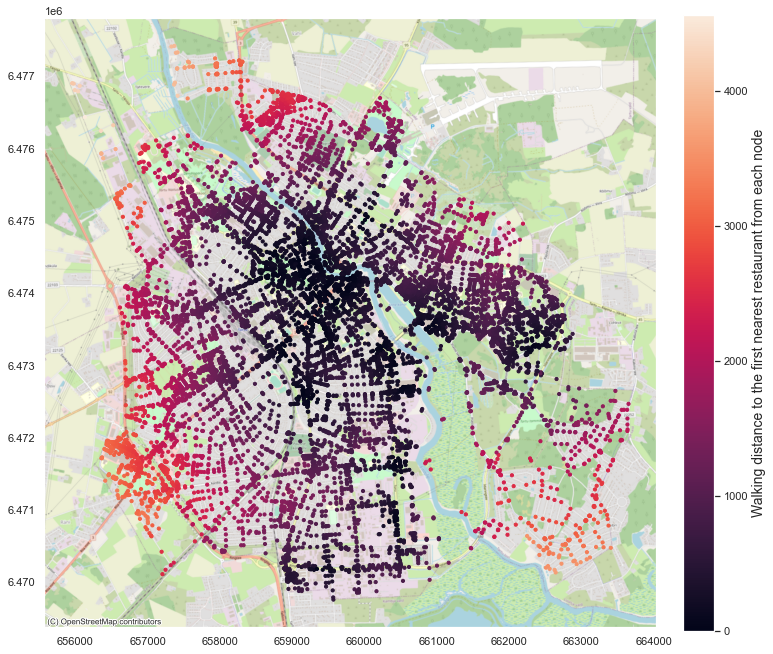

In [61]:
#Walking distance to the first nearest restaurant from each node
fig,ax=plt.subplots(1,1,figsize=(12,12))
restaurants_3301.plot(ax=ax,c=restaurants_3301[1],markersize=10)
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=min(restaurants_3301[1]), vmax=max(restaurants_3301[1])))
cbar = fig.colorbar(sm,fraction=0.046, pad=0.04)
cbar.set_label('Walking distance to the first nearest restaurant from each node',fontdict={'fontsize': '14', 'fontweight' : '3'})
plt.grid(False)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\1755466333.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(sm,fraction=0.046, pad=0.04)
C:\Users\Kasutaja\AppData\Local\Temp\ipykernel_964\1755466333.py:7: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Ma

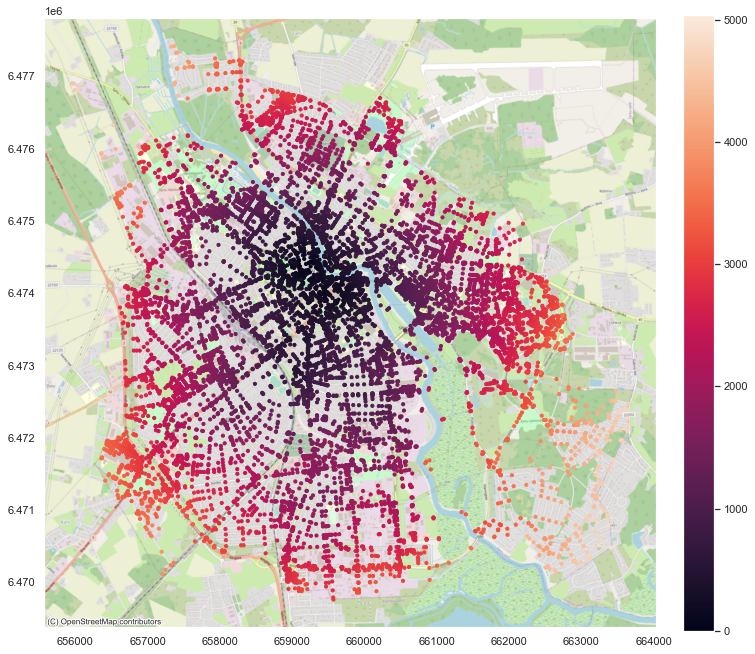

In [62]:
#Walking distance to the fifth nearest restaurant from each node
fig,ax=plt.subplots(1,1,figsize=(12,12))
restaurants_3301.plot(ax=ax,c=restaurants_3301[5],markersize=10)
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=min(restaurants_3301[5]), vmax=max(restaurants_3301[5])))
cbar.set_label('Walking distance to the fifth nearest restaurant from each node',fontdict={'fontsize': '14', 'fontweight' : '3'})
cbar = fig.colorbar(sm,fraction=0.046, pad=0.04)
plt.grid(False)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")

# Accessibility map representing walkable neighborhoods in Tartu

In [85]:
nearest_POI_tartu=gpd.GeoDataFrame(pd.concat([results_tartu[[1]],nodes_tartu],axis=1),geometry="geometry")
nearest_POI_tartu

,1,x,y,geometry,index_right,ANIMI,AKOOD,TYYP,ONIMI,OKOOD,MNIMI,MKOOD
id,,,,,,,,,,,,
8220933,119.190002,26.730165,58.378573,POINT (659682.195 6474149.521),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8220937,175.072998,26.730356,58.379065,POINT (659691.158 6474204.763),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8220941,162.701004,26.730560,58.379786,POINT (659699.775 6474285.473),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8220974,50.122002,26.726640,58.386388,POINT (659440.766 6475010.837),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
8221115,76.574997,26.728486,58.389628,POINT (659534.012 6475375.794),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
...,...,...,...,...,...,...,...,...,...,...,...,...
9567774783,288.798004,26.693269,58.382742,POINT (657506.744 6474526.309),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
9567774794,206.897995,26.692412,58.383384,POINT (657453.768 6474595.676),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079
9694890969,62.842999,26.741194,58.366988,POINT (660379.654 6472886.570),0,Tartu linn,8151,5,Tartu linn,0793,Tartu maakond,0079


C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\osmnx\geocoder.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(_geocode_query_to_gdf(q, wr, by_osmid))
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2

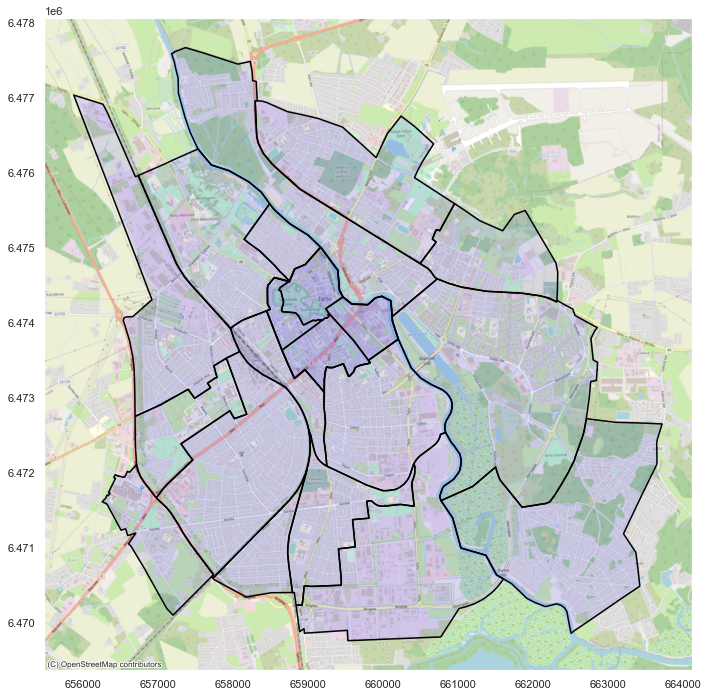

In [132]:
#Tartu's neighbourhoods
tartu_neighbourhoods=ox.geometries.geometries_from_place("Tartu",tags={'place':'suburb'})
tartu_neighbourhoods=tartu_neighbourhoods.to_crs("EPSG:3301")
tartu_neighbourhoods_boundary=tartu_neighbourhoods.boundary.to_crs("EPSG:3301")

fig,ax=plt.subplots(1,1,figsize=(12,12))
tartu_neighbourhoods.plot(ax=ax,alpha=0.1,color='blue')
tartu_neighbourhoods_boundary.plot(ax=ax,color='black')
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")
plt.grid(False)

In [176]:
tartu_neighbourhoods

nodes  \
element_type osmid                                                         
relation     4570269   [[[579708022, 3337824353, 3337824354, 33378243...   
             4570300   [[[3337824366, 8154384310, 3337847617, 4739253...   
             4570419   [[[579737673, 3337871439, 3337871438, 33378714...   
             4570553   [[[3337916808, 3337916807, 3337916806, 3337916...   
             4571250   [[[579737604, 579737605, 579737606, 579737607,...   
             4571269   [[[579737567, 3338240931, 3338240933, 33382409...   
             4571316   [[[3338284934, 3338284943, 3338284945, 3338284...   
             4571354   [[[3338240943, 3338328504, 3338328505], [33383...   
             4571540   [[[3338399168, 3338399167, 3338399166, 3338399...   
             4571562   [[[3338415830, 3338415831, 3338415832, 3338415...   
             4572066   [[[3338647068, 3338647067, 3338647065, 3338647...   
             4572171   [[[3338647044, 3338691746, 3338691736, 3338691...   
             4572218   [[[3338415830, 3338415831, 3338415832, 3338415...   
             4572236   [[[3338708250, 294540644, 294540646, 294540648...   
             4572258   [[[294540679, 2721236318, 294540681, 294540685...   
             4572273   [[[3338762651, 3338790418, 3338790417, 3338790...   
             4572274   [[[3338762651, 3338790418, 3338790417, 3338790...   
             12524099  [[[3338211031, 3338211027, 3338211026, 3338211...   
             12532594  [[[3338708248, 3338708246, 3338708245, 3338708...   
             12532657  [[[3337916794, 8590077465, 8590077464, 8590077...   
             12532774  [[[3337916802, 3338211035, 3338211032, 3338211...   

                                                                geometry  \
element_type osmid                                                         
relation     4570269   POLYGON ((660490.714 6474784.778, 660705.494 6...   
             4570300   POLYGON ((658319.628 6476954.789, 658381.570 6...   
             4570419   POLYGON ((656607.242 6471045.482, 656602.861 6...   
             4570553   POLYGON ((658485.206 6475582.216, 658547.832 6...   
             4571250   POLYGON ((657203.642 6477603.243, 657208.781 6...   
             4571269   POLYGON ((656711.097 6472107.181, 656696.370 6...   
             4571316   POLYGON ((657728.828 6470590.392, 658571.728 6...   
             4571354   POLYGON ((656973.918 6471661.119, 657066.983 6...   
             4571540   POLYGON ((656538.201 6475296.201, 656479.391 6...   
             4571562   POLYGON ((656733.465 6475959.052, 656787.557 6...   
             4572066   POLYGON ((657964.029 6473920.047, 658000.794 6...   
             4572171   POLYGON ((658789.830 6470399.337, 658739.310 6...   
             4572218   POLYGON ((658444.279 6474155.261, 658492.885 6...   
             4572236   POLYGON ((659247.527 6472084.610, 659235.132 6...   
             4572258   POLYGON ((660118.366 6474077.741, 660455.274 6...   
             4572273   POLYGON ((660769.721 6471624.573, 661191.142 6...   
             4572274   POLYGON ((658836.784 6470235.761, 658918.988 6...   
             12524099  POLYGON ((659276.396 6474120.420, 659233.555 6...   
             12532594  POLYGON ((658649.363 6473630.418, 659148.099 6...   
             12532657  POLYGON ((658444.279 6474155.261, 658492.885 6...   
             12532774  POLYGON ((658747.993 6474544.936, 658815.275 6...   

                                                                    ways  \
element_type osmid                                                         
relation     4570269   [327071159, 327104774, 327072853, 45494444, 45...   
             4570300         [327072852, 45494450, 327071161, 327072853]   
             4570419   [327076357, 327109026, 327076358, 45494453, 45...   
             4570553                   [327079672, 327079671, 327123287]   
             4571250   [45494447, 45494451, 327072854, 327072852, 327...   
             4571269        [32710902

In [ ]:
nearest_POI_tartu=nearest_POI_tartu.drop(columns=["index_right"])

In [186]:
POI_neighbours=gpd.sjoin(nearest_POI_tartu,tartu_neighbourhoods.reset_index(),op="within").reset_index().drop_duplicates(["id"],keep="last")
POI_neighbours

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\IPython\core\interactiveshell.py:3301: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,id,1,x,y,geometry,ANIMI,AKOOD,TYYP,ONIMI,OKOOD,...,osmid,nodes,ways,name,place,type,wikidata,wikipedia,name:de,population
113,330045927,13.892000,26.725527,58.380022,POINT (659404.532 6474299.755),Tartu linn,8151,5,Tartu linn,0793,...,4572218,"[[[3338415830, 3338415831, 3338415832, 3338415...","[327143241, 327079671, 327104771, 327150439, 3...",Kesklinn,suburb,multipolygon,Q6395101,et:Kesklinn (Tartu),NaN,6465
1658,8220933,119.190002,26.730165,58.378573,POINT (659682.195 6474149.521),Tartu linn,8151,5,Tartu linn,0793,...,12524099,"[[[3338211031, 3338211027, 3338211026, 3338211...","[327104771, 327150439, 924853287, 925610911, 9...",Uueturu,suburb,multipolygon,Q106356210,NaN,NaN,NaN
1659,8220937,175.072998,26.730356,58.379065,POINT (659691.158 6474204.763),Tartu linn,8151,5,Tartu linn,0793,...,12524099,"[[[3338211031, 3338211027, 3338211026, 3338211...","[327104771, 327150439, 924853287, 925610911, 9...",Uueturu,suburb,multipolygon,Q106356210,NaN,NaN,NaN
1660,330036518,28.257000,26.723765,58.378670,POINT (659307.629 6474145.053),Tartu linn,8151,5,Tartu linn,0793,...,12524099,"[[[3338211031, 3338211027, 3338211026, 3338211...","[327104771, 327150439, 924853287, 925610911, 9...",Uueturu,suburb,multipolygon,Q106356210,NaN,NaN,NaN
1661,330036519,0.000000,26.725232,58.378327,POINT (659394.944 6474110.445),Tartu linn,8151,5,Tartu linn,0793,...,12524099,"[[[3338211031, 3338211027, 3338211026, 3338211...","[327104771, 327150439, 924853287, 925610911, 9...",Uueturu,suburb,multipolygon,Q106356210,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14711,9273834508,365.619995,26.713578,58.385768,POINT (658680.179 6474910.887),Tartu linn,8151,5,Tartu linn,0793,...,4570553,"[[[3337916808, 3337916807, 3337916806, 3337916...","[327079672, 327079671, 327123287]",Supilinn,suburb,multipolygon,Q3744454,et:Supilinn,NaN,NaN
14712,9273834509,362.061005,26.713625,58.385748,POINT (658683.029 6474908.740),Tartu linn,8151,5,Tartu linn,0793,...,4570553,"[[[3337916808, 3337916807, 3337916806, 3337916...","[327079672, 327079671, 327123287]",Supilinn,suburb,multipolygon,Q3744454,et:Supilinn,NaN,NaN
14713,9273834510,379.261993,26.713402,58.385849,POINT (658669.506 6474919.440),Tartu linn,8151,5,Tartu linn,0793,...,4570553,"[[[3337916808, 3337916807, 3337916806, 3337916...","[327079672, 327079671, 327123287]",Supilinn,suburb,multipolygon,Q3744454,et:Supilinn,NaN,NaN
14714,9273834513,369.769989,26.713524,58.385793,POINT (658676.930 6474913.487),Tartu linn,8151,5,Tartu linn,0793,...,4570553,"[[[3337916808, 3337916807, 3337916806, 3337916...","[327079672, 327079671, 327123287]",Supilinn,suburb,multipolygon,Q3744454,et:Supilinn,NaN,NaN


In [191]:
#mean distance to POI in each neighbourhood
POI_neighbours.groupby(["name"]).mean()[1]

name
Annelinn                91.083743
Ihaste                 741.080850
Jaamamõisa             180.759550
Karlova                 95.197316
Kesklinn                13.892000
Maarjamõisa             92.741402
Raadi-Kruusamäe        174.850895
Riiamäe                 39.233777
Ropka                  122.496258
Ropka tööstusrajoon    165.864754
Ränilinn               131.856231
Supilinn               233.438086
Tammelinn              182.783142
Toometaguse             49.551809
Tähtvere                98.924331
Uueturu                 30.227419
Vaksali                 46.168410
Vanalinn                71.596998
Variku                 550.352013
Veeriku                174.000833
Ülejõe                  95.760014
Name: 1, dtype: float64

In [194]:
tartu_neighbourhoods_POI_distance=tartu_neighbourhoods.merge(POI_neighbours.groupby(["name"]).mean()[1],left_on='name',right_on='name')

In [211]:
tartu_neighbourhoods_POI_distance["time"]=(tartu_neighbourhoods_POI_distance[1]/1.39/60).apply(lambda x: round(x,2))

In [214]:
tartu_neighbourhoods_POI_distance["time"]

0     2.17
1     2.10
2     1.58
3     2.80
4     1.15
5     1.11
6     6.60
7     2.19
8     2.09
9     1.19
10    0.55
11    1.47
12    0.17
13    1.14
14    1.09
15    8.89
16    1.99
17    0.36
18    0.47
19    0.59
20    0.86
Name: time, dtype: float64

C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:740: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mapclassify.__version__ < LooseVersion("2.4.0"):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\geopandas\plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages\setuptools\_distutils\version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Kasutaja\anaconda3\envs\geopandas\lib\site-packages

Text(0.5, 1.0, 'Walkable neighbourhoods in Tartu')

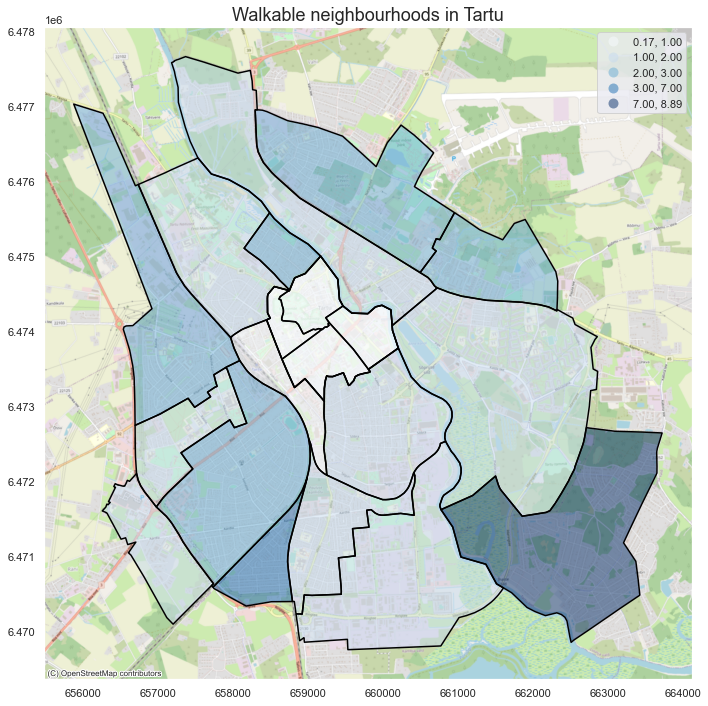

In [230]:
#let's assume that average walking speed is 5 km/h or 1.39 m/s
fig,ax=plt.subplots(1,1,figsize=(12,12))
tartu_neighbourhoods_POI_distance.plot(ax=ax,alpha=0.5,column="time",cmap="Blues", scheme="User_Defined",
                                      legend=True,classification_kwds=dict(bins=[1,2,3,7]))
tartu_neighbourhoods_boundary.plot(ax=ax,color='black')
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3301")
plt.grid(False)
plt.title("Walkable neighbourhoods in Tartu",fontsize='18')

# --------------------------------------------- Task 2 ------------------------------------------------------

In [203]:
#some data preprocessing and loading
df_taxi=pd.read_csv("yellow_tripdata_2020-01.csv")
df_taxi


KeyboardInterrupt



In [3]:
df_taxi=df_taxi.dropna()

In [4]:
df_taxi

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2020-01-01 00:28:15,2020-01-01 00:33:03,1.0,1.20,1.0,N,238,239,1.0,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5
1,1.0,2020-01-01 00:35:39,2020-01-01 00:43:04,1.0,1.20,1.0,N,239,238,1.0,7.0,3.0,0.5,1.50,0.0,0.3,12.30,2.5
2,1.0,2020-01-01 00:47:41,2020-01-01 00:53:52,1.0,0.60,1.0,N,238,238,1.0,6.0,3.0,0.5,1.00,0.0,0.3,10.80,2.5
3,1.0,2020-01-01 00:55:23,2020-01-01 01:00:14,1.0,0.80,1.0,N,238,151,1.0,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0
4,2.0,2020-01-01 00:01:58,2020-01-01 00:04:16,1.0,0.00,1.0,N,193,193,2.0,3.5,0.5,0.5,0.00,0.0,0.3,4.80,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6339562,2.0,2020-01-31 23:38:07,2020-01-31 23:52:21,1.0,2.10,1.0,N,163,246,1.0,11.0,0.5,0.5,2.96,0.0,0.3,17.76,2.5
6339563,2.0,2020-01-31 23:00:18,2020-01-31 23:19:18,1.0,2.13,1.0,N,164,79,1.0,13.0,0.5,0.5,3.36,0.0,0.3,20.16,2.5
6339564,2.0,2020-01-31 23:24:22,2020-01-31 23:40:39,1.0,2.55,1.0,N,79,68,1.0,12.5,0.5,0.5,3.26,0.0,0.3,19.56,2.5
6339565,2.0,2020-01-31 23:44:22,2020-01-31 23:54:00,1.0,1.61,1.0,N,100,142,2.0,8.5,0.5,0.5,0.00,0.0,0.3,12.30,2.5


In [5]:
#check data types
df_taxi.dtypes

VendorID                 float64
tpep_pickup_datetime      object
tpep_dropoff_datetime     object
passenger_count          float64
trip_distance            float64
RatecodeID               float64
store_and_fwd_flag        object
PULocationID               int64
DOLocationID               int64
payment_type             float64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
improvement_surcharge    float64
total_amount             float64
congestion_surcharge     float64
dtype: object

In [6]:
taxi_zones=pd.read_csv("taxi_zones.csv")
taxi_zones

,OBJECTID,Shape_Leng,the_geom,Shape_Area,zone,LocationID,borough
0,1,0.116357,MULTIPOLYGON (((-74.18445299999996 40.69499599...,0.000782,Newark Airport,1,EWR
1,2,0.433470,MULTIPOLYGON (((-73.82337597260663 40.63898704...,0.004866,Jamaica Bay,2,Queens
2,3,0.084341,MULTIPOLYGON (((-73.84792614099985 40.87134223...,0.000314,Allerton/Pelham Gardens,3,Bronx
3,4,0.043567,MULTIPOLYGON (((-73.97177410965318 40.72582128...,0.000112,Alphabet City,4,Manhattan
4,5,0.092146,MULTIPOLYGON (((-74.17421738099989 40.56256808...,0.000498,Arden Heights,5,Staten Island
...,...,...,...,...,...,...,...
258,256,0.067915,MULTIPOLYGON (((-73.95834207500002 40.71330630...,0.000169,Williamsburg (South Side),256,Brooklyn
259,259,0.126750,MULTIPOLYGON (((-73.85107116191898 40.91037152...,0.000395,Woodlawn/Wakefield,259,Bronx
260,260,0.133514,MULTIPOLYGON (((-73.90175373399988 40.76077547...,0.000422,Woodside,260,Queens
261,261,0.027120,MULTIPOLYGON (((-74.01332610899988 40.70503078...,0.000034,World Trade Center,261,Manhattan


In [7]:
taxi_zones['geometry'] = taxi_zones.the_geom.apply(wkt.loads)

In [8]:
taxi_zones=taxi_zones.drop(columns=["the_geom"])

In [9]:
taxi_zones_gdf=gpd.GeoDataFrame(taxi_zones,geometry="geometry",crs="EPSG:4326")
taxi_zones_gdf

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."
...,...,...,...,...,...,...,...
258,256,0.067915,0.000169,Williamsburg (South Side),256,Brooklyn,"MULTIPOLYGON (((-73.95834 40.71331, -73.95681 ..."
259,259,0.126750,0.000395,Woodlawn/Wakefield,259,Bronx,"MULTIPOLYGON (((-73.85107 40.91037, -73.85207 ..."
260,260,0.133514,0.000422,Woodside,260,Queens,"MULTIPOLYGON (((-73.90175 40.76078, -73.90147 ..."
261,261,0.027120,0.000034,World Trade Center,261,Manhattan,"MULTIPOLYGON (((-74.01333 40.70503, -74.01327 ..."


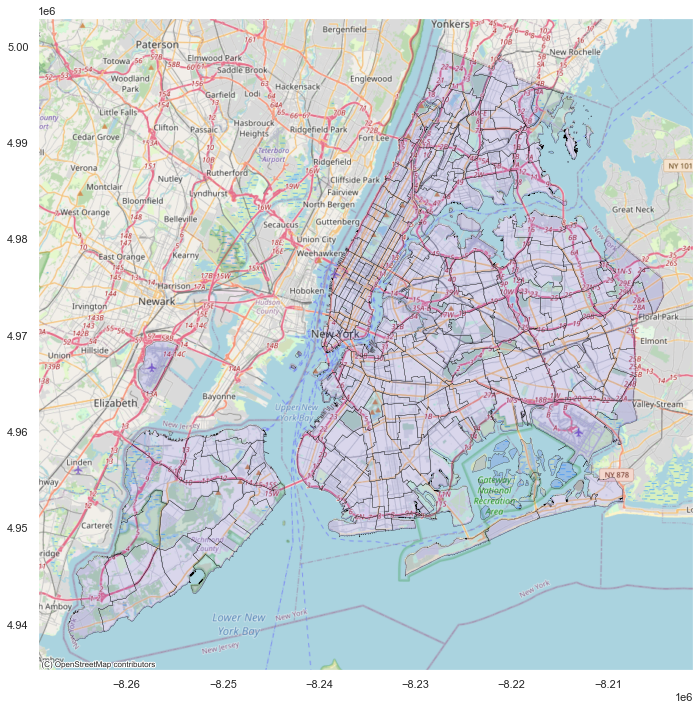

In [10]:
#taxi zones on the map
taxi_zones_3857=taxi_zones_gdf.to_crs("EPSG:3857")
taxi_zones_3857_boundary=taxi_zones_3857.boundary.to_crs("EPSG:3857")
fig,ax=plt.subplots(1,1,figsize=(12,12))
taxi_zones_3857.plot(ax=ax,alpha=0.1,color='blue')
taxi_zones_3857_boundary.plot(ax=ax,color='black',linewidth=0.25)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3857")
plt.grid(False)

In [12]:
#turn zones to centroids
taxi_zones_3857["geometry"]=taxi_zones_3857.centroid
taxi_zones_3857

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,POINT (-8257011.868 4966992.851)
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,POINT (-8218862.489 4955975.454)
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,POINT (-8220657.464 4992372.119)
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,POINT (-8235078.436 4971680.182)
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,POINT (-8258624.245 4946581.406)
...,...,...,...,...,...,...,...
258,256,0.067915,0.000169,Williamsburg (South Side),256,Brooklyn,POINT (-8233178.925 4969789.615)
259,259,0.126750,0.000395,Woodlawn/Wakefield,259,Bronx,POINT (-8221191.037 4997298.364)
260,260,0.133514,0.000422,Woodside,260,Queens,POINT (-8227212.358 4974689.500)
261,261,0.027120,0.000034,World Trade Center,261,Manhattan,POINT (-8239092.003 4969533.942)


# Point pattern analysis based on a distance-based approach to identify nature of the data

<h5>
Unfortunately, my PC can't handle with such big dataset, I tried different methods (including StratifiedKFold from sklearn) to reduce the size and save the same data's distribution, but it also didn't work because of memory issues. I will use 5000 rows from shuffled dataset
</h5>

In [13]:
from sklearn.utils import shuffle
df_taxi = shuffle(df_taxi,random_state=0)

In [17]:
df_taxi=df_taxi.iloc[0:5000].reset_index().drop(columns=["index"])

In [18]:
#split taxi dataset to 2 datasets: 1 with start point, the other one with destination point
df_taxi_start=gpd.GeoDataFrame(df_taxi.merge(taxi_zones_3857, left_on="PULocationID",right_on="LocationID"),geometry="geometry",crs="EPSG:3857")
df_taxi_end=gpd.GeoDataFrame(df_taxi.merge(taxi_zones_3857, left_on="DOLocationID",right_on="LocationID"),geometry="geometry",crs="EPSG:3857")

In [14]:
df_taxi_start_4326=df_taxi_start.to_crs("EPSG:4326")
df_taxi_end_4326=df_taxi_end.to_crs("EPSG:4326")

In [19]:
df_taxi_start["x"]=df_taxi_start["geometry"].x
df_taxi_start["y"]=df_taxi_start["geometry"].y
df_taxi_end["x"]=df_taxi_end["geometry"].x
df_taxi_end["y"]=df_taxi_end["geometry"].y

In [20]:
points_start=df_taxi_start[["x","y"]].values.tolist()

In [21]:
points_end=df_taxi_end[["x","y"]].values.tolist()

In [22]:
from pointpats import PointPattern, PoissonPointProcess, as_window, G, F, J, K, L, Genv, Fenv, Jenv, Kenv, Lenv

In [23]:
import pointpats
pointpats.__version__

'2.1.0'

In [25]:
pp_start = PointPattern(points_start)
pp_end = PointPattern(points_end)

In [1]:
#I used L function to identify whether the data is clustered or not
#values above 0 indicate clustering, while below 0 show that data is dispersed https://mgimond.github.io/Spatial/chp11_0.html
#According to plots, start and end points are a little bit clustered until 5000m, but afterwards they become more and more
#dispersed
#manual - https://nbviewer.org/github/pysal/pointpats/blob/master/notebooks/distance_statistics.ipynb

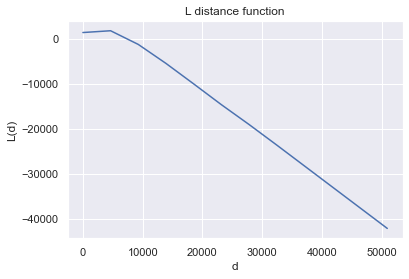

In [28]:
lp_start = L(pp_start)
lp_start.plot()

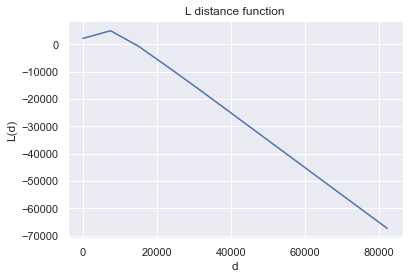

In [29]:
lp_end = L(pp_end)
lp_end.plot()

# Hotspots for nightlife activities in NYC

In [153]:
taxi_zones=pd.read_csv("taxi_zones.csv")
taxi_zones['geometry'] = taxi_zones.the_geom.apply(wkt.loads)
taxi_zones=taxi_zones.drop(columns=["the_geom"])
taxi_zones_gdf=gpd.GeoDataFrame(taxi_zones,geometry="geometry",crs="EPSG:4326")
taxi_zones_3857=taxi_zones_gdf.to_crs("EPSG:3857")

In [155]:
df_taxi=pd.read_csv("yellow_tripdata_2020-01.csv")
df_taxi=df_taxi.dropna()
df_taxi["tpep_pickup_datetime"]=pd.to_datetime(df_taxi["tpep_pickup_datetime"])
df_taxi["tpep_dropoff_datetime"]=pd.to_datetime(df_taxi["tpep_dropoff_datetime"])
df_taxi_start=gpd.GeoDataFrame(df_taxi.merge(taxi_zones_3857, left_on="PULocationID",right_on="LocationID"),geometry="geometry",crs="EPSG:3857")
df_taxi_end=gpd.GeoDataFrame(df_taxi.merge(taxi_zones_3857, left_on="DOLocationID",right_on="LocationID"),geometry="geometry",crs="EPSG:3857")

In [159]:
df_taxi_start["hour"]=df_taxi_start["tpep_pickup_datetime"].dt.hour
df_taxi_end["hour"]=df_taxi_start["tpep_dropoff_datetime"].dt.hour

In [160]:
#let's assume that night time is from 0 until 5 a.m.
df_taxi_start["is_night"]=((df_taxi_start["hour"]>0) & (df_taxi_start["hour"]<5)).astype("int")
df_taxi_end["is_night"]=((df_taxi_end["hour"]>0) & (df_taxi_end["hour"]<5)).astype("int")

In [161]:
df_taxi_start=df_taxi_start.groupby("PULocationID").sum().reset_index()

In [162]:
df_taxi_end=df_taxi_end.groupby("DOLocationID").sum().reset_index()

In [164]:
df_taxi_start=df_taxi_start.merge(taxi_zones_3857[["geometry","LocationID"]],left_on="PULocationID",right_on="LocationID")
df_taxi_end=df_taxi_end.merge(taxi_zones_3857[["geometry","LocationID"]],left_on="DOLocationID",right_on="LocationID")

In [165]:
df_taxi_start=gpd.GeoDataFrame(df_taxi_start,geometry="geometry",crs="EPSG:4326")
df_taxi_end=gpd.GeoDataFrame(df_taxi_end,geometry="geometry",crs="EPSG:4326")

In [167]:
df_taxi_start=df_taxi_start[df_taxi_start["is_night"]>0]
df_taxi_end=df_taxi_end[df_taxi_end["is_night"]>0]

In [168]:
#spatial weights

import libpysal as lps

wq_start =  lps.weights.Queen.from_dataframe(df_taxi_start)
wq_end =  lps.weights.Queen.from_dataframe(df_taxi_end)

In [169]:
#Moran’s I test for global autocorrelation

In [170]:
wq_start.transform = 'r'
wq_end.transform = 'r'

('WARNING: ', 0, ' is an island (no neighbors)')
('WARNING: ', 40, ' is an island (no neighbors)')
('WARNING: ', 181, ' is an island (no neighbors)')
('WARNING: ', 0, ' is an island (no neighbors)')
('WARNING: ', 30, ' is an island (no neighbors)')
('WARNING: ', 38, ' is an island (no neighbors)')
('WARNING: ', 69, ' is an island (no neighbors)')


In [171]:
df_taxi_start=df_taxi_start.reset_index().drop(columns=["index"]).drop(index=[0,40,181]).reset_index().drop(columns=["index"])
df_taxi_end=df_taxi_end.reset_index().drop(columns=["index"]).drop(index=[0,30,38,69]).reset_index().drop(columns=["index"])
wq_start =  lps.weights.Queen.from_dataframe(df_taxi_start)
wq_end =  lps.weights.Queen.from_dataframe(df_taxi_end)
wq_start.transform = 'r'
wq_end.transform = 'r'

In [172]:
import esda
mi_start = esda.moran.Moran(df_taxi_start["is_night"], wq_start)
mi_end = esda.moran.Moran(df_taxi_end["is_night"], wq_end)

In [173]:
print(mi_start.I)
print(mi_end.I)

0.5572768987741263
0.4937483237990811


Text(0.5, 0, "Moran's I")

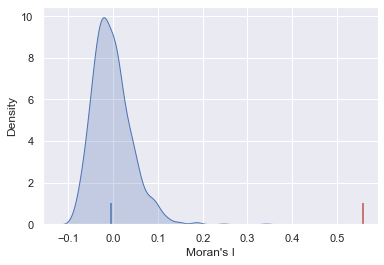

In [174]:
import seaborn as sbn
sbn.kdeplot(mi_start.sim, shade=True)
plt.vlines(mi_start.I, 0, 1, color='r')
plt.vlines(mi_start.EI, 0,1)
plt.xlabel("Moran's I")

In [175]:
mi_start.p_sim

0.001

Text(0.5, 0, "Moran's I")

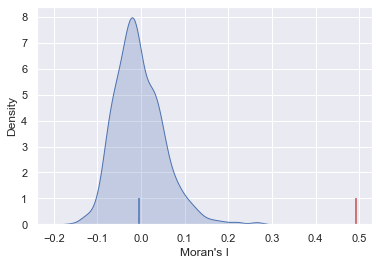

In [176]:
import seaborn as sbn
sbn.kdeplot(mi_end.sim, shade=True)
plt.vlines(mi_end.I, 0, 1, color='r')
plt.vlines(mi_end.EI, 0,1)
plt.xlabel("Moran's I")

In [177]:
mi_end.p_sim

0.001

In [178]:
#statistical tests and plots above demonstrate that there is spatial autocorrelation

In [179]:
#Let’s compute a local Moran statistic
wq_start.transform = 'r'
wq_end.transform = 'r'

In [180]:
li_start = esda.moran.Moran_Local(df_taxi_start["is_night"], wq_start, transformation = "r")
li_end = esda.moran.Moran_Local(df_taxi_end["is_night"], wq_end, transformation = "r")

In [181]:
np.unique(li_start.q,return_counts=True)

(array([1, 2, 3, 4]), array([ 39,  11, 181,   3], dtype=int64))

In [182]:
sig_start = li_start.p_sim < 0.05
hotspot_start = sig_start * li_start.q==1
sig_end = li_end.p_sim < 0.05
hotspot_end = sig_end * li_end.q==1

In [183]:
df_taxi_start["is_hotspot"]=hotspot_start
df_taxi_end["is_hotspot"]=hotspot_end

In [186]:
df_taxi_start_boundary=df_taxi_start.boundary.to_crs("EPSG:3857")
df_taxi_end_boundary=df_taxi_end.boundary.to_crs("EPSG:3857")

Text(0.5, 1.0, 'Hotspots of starting points')

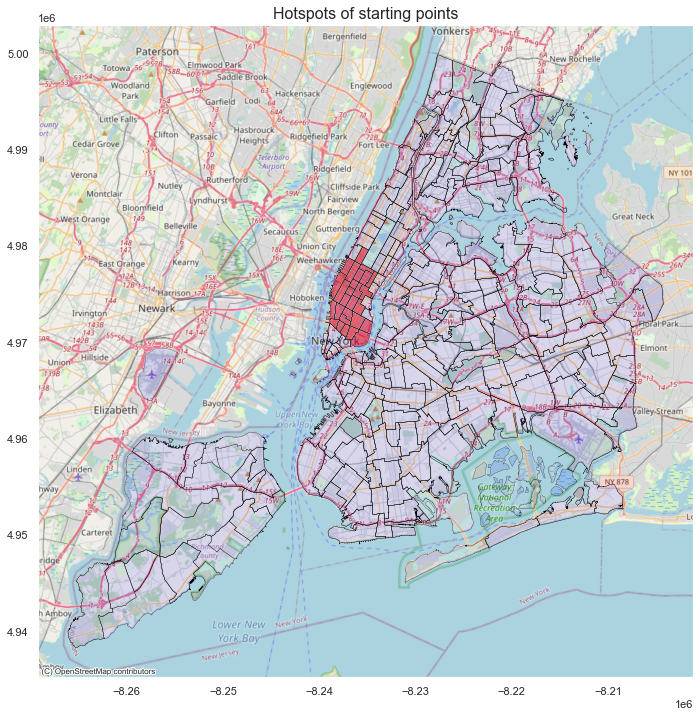

In [202]:
fig,ax=plt.subplots(1,1,figsize=(12,12))
df_taxi_start[df_taxi_start["is_hotspot"]].plot(ax=ax,color="red",alpha=0.5)
df_taxi_start_boundary.plot(ax=ax,color='black',linewidth=0.25)
taxi_zones_3857.plot(ax=ax,alpha=0.1,color='blue')
taxi_zones_3857.boundary.plot(ax=ax,color='black',linewidth=0.25)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3857")
plt.grid(False)
plt.title("Hotspots of starting points",fontsize=16)

Text(0.5, 1.0, 'Hotspots of ending points')

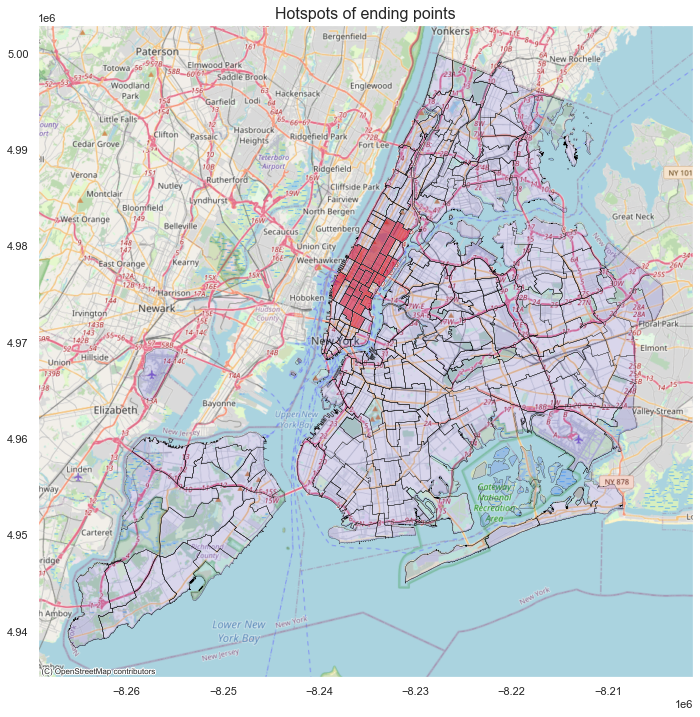

In [198]:
fig,ax=plt.subplots(1,1,figsize=(12,12))
df_taxi_end[df_taxi_end["is_hotspot"]].plot(ax=ax,color="red",alpha=0.5)
df_taxi_end_boundary.plot(ax=ax,color='black',linewidth=0.25)
taxi_zones_3857.plot(ax=ax,alpha=0.1,color='blue')
taxi_zones_3857.boundary.plot(ax=ax,color='black',linewidth=0.25)
ctx.add_basemap(ax=ax, url=ctx.providers.OpenStreetMap.Mapnik, crs="EPSG:3857")
plt.grid(False)
plt.title("Hotspots of ending points",fontsize=16)